# 0. 라이브러리, 함수 및 옵션 셋팅

In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import pandas as pd
from IPython.display import display
import numpy as np

import geojson
import geopandas as gpd
import zipfile
from datetime import datetime
import re

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler

from geoband.API import *
from sklearn.preprocessing import StandardScaler

In [2]:
# 크리깅
from pykrige.ok import OrdinaryKriging
from pykrige.rk import RegressionKriging
import skgstat as skg # auto variogram
from shapely.geometry import Point
from scipy.spatial import distance_matrix

# 맵 그리기
from shapely.geometry import Polygon, Point
from scipy.spatial import distance_matrix
import time
from mip import Model, xsum, maximize, BINARY
import plotly.express as px
import plotly.io as pio
import plotly.graph_objs as go

TOKEN = 'pk.eyJ1IjoiYnllb25naGVvbiIsImEiOiJja3N2Zzc4bWgxcTMwMnFudnNla2d1dm02In0.z5Lfa_vDMEswJaJEv82IWg'
CENTER = dict(lon = 126.985464, lat = 37.559000)
ZOOM = 9.5
px.set_mapbox_access_token(TOKEN)

Using Python-MIP package version 1.5.3


In [3]:
def Get_Coordinates(lon, lat) : 
    return list(map(lambda x, y : [x,y], lon, lat))

def Get_Coordinates_Point(lon, lat) : 
    return list(map(lambda x, y : Point(x,y), lon, lat))

def Get_Center_Coordinates_Multi(geometry) : 
    return list( map(lambda k: np.mean(k), geometry[0].exterior.xy ) )

def Multipolygon_to_Coordinates(poly): 
    lon, lat = poly[0].exterior.xy 
    return [[x, y] for x, y in zip(lon, lat)] 

def Polygon_to_Coordinates(poly): 
    lon, lat = poly.exterior.xy 
    return [[x, y] for x, y in zip(lon, lat)] 

def Multipolygon_to_Center_Coordinates(poly): 
    center = list(poly[0].centroid.coords)[0]
    return [center[0], center[1]]

In [4]:
def Start(points, K, radius, M) : 
    print('----- Configurations -----')
    print('  Number of points %g' % points.shape[0])
    print('  K %g' % K)
    print('  Radius %g' % radius)
    print('  M %g' % M)
    return time.time()

def generate_candidate_sites(df,Weight,M=100):
    sites = []
    idx = df.sort_values(by = Weight, ascending = False).iloc[:M].index
    for i in range(len(idx)):
        random_point = Point(np.array(df.loc[idx]['coordinates'])[i][0], #lon
                             np.array(df.loc[idx]['coordinates'])[i][1]) #lat
        sites.append(random_point)
    return np.array([(p.x,p.y) for p in sites])

def mclp(K, radius, M, df, Weight = None):
    
    points = np.array(df['coordinates'].tolist())
    radius = (1/88.74/1000)*radius
    w = [1] * df.shape[0]
    
    start = Start(points, K, radius, M)
    if(Weight == None) : 
        idx = np.random.choice(df.index.tolist(), M)
        sites = np.array(df.loc[idx, 'coordinates'].tolist())
    else : 
        sites = generate_candidate_sites(df,Weight,M)
    J = sites.shape[0]
    I = points.shape[0]
    
    D = distance_matrix(points, sites)
    mask1 = D<=radius
    D[mask1]=1 ; D[~mask1]=0

    m = Model("mclp")
    x = [m.add_var(name = "x%d" % j, var_type = BINARY) for j in range(J)]
    y = [m.add_var(name = "y%d" % i, var_type = BINARY) for i in range(I)]

    m.objective = maximize(xsum(w[i]*y[i] for i in range (I)))
    m += xsum(x[j] for j in range(J)) == K

    for i in range(I):
        m += xsum(x[j] for j in np.where(D[i]==1)[0]) >= y[i]

    m.max_gap = 0.05
    m.optimize(max_seconds=300)
    
    end = time.time()
    print('----- Output -----')
    print('  Running time : %s seconds' % float(end-start))
    print('  Optimal coverage points: %g' % m.objective_value)

    solution = []
    for i in range(J):
        if x[i].x ==1:
            solution.append(int(x[i].name[1:]))
    opt_sites = sites[solution]
            
    return opt_sites,m.objective_value

In [5]:
def Get_Scaled_Weight(df_Weights, columns, weights) : 
    scaled_data = []
    for col in columns : 
        scaler = MinMaxScaler()
        scaled_data.append(scaler.fit_transform(df_Weights[[col]]).reshape(-1,))
    
    score = np.zeros(df_Weights.shape[0])
    for i, w in enumerate(weights) : 
        score += (w * scaled_data[i])
    return score

def Get_Candidates_Near_Weight(df_Weight, Weight) : 
    a = np.array(df_candidates['coordinates'].tolist())
    b = np.array(df_Weight['coordinates'].tolist())
    D = distance_matrix(a,b)
    return list(map(lambda d : df_Weight.iloc[np.argmin(d)][Weight], D))

# 1. 데이터 읽기
- Get_data(dir_path, isdownloaded = True) 를 통해 all_data에 모든 데이터 저장(all_data의 타입은 dict)
  - isdownloaded 옵션은 이미 데이터가 다운 받아졌는지 물어보는 옵션

In [6]:
def Download_all_data() : 
    GetCompasData('SBJ_2107_001', '1', '1.서울시_S-DoT_설치현황자료.csv')
    GetCompasData('SBJ_2107_001', '2', '2.서울시_S-DoT_측정자료.csv')
    GetCompasData('SBJ_2107_001', '3', '3.서울시_TOPIS지점별교통량.csv')
    GetCompasData('SBJ_2107_001', '4', '4.서울시_TOPIS교통량측정지점.csv')
    GetCompasData('SBJ_2107_001', '5', '5.서울시_일별평균_대기오염도이력.csv')
    GetCompasData('SBJ_2107_001', '6', '6.서울시_대기오염도_측정지점.csv')
    GetCompasData('SBJ_2107_001', '7', '7.서울시_미세먼지_발생사업장정보.csv')
    GetCompasData('SBJ_2107_001', '8', '8.서울시_버스정류소_공간정보.csv')
    GetCompasData('SBJ_2107_001', '9', '9.서울시_버스정류소별_승하차이력.zip')
    GetCompasData('SBJ_2107_001', '10', '10.서울시_지하철역_공간정보.geojson')
    GetCompasData('SBJ_2107_001', '11', '11.서울시_지하철역별_승하차이력.csv')
    GetCompasData('SBJ_2107_001', '12', '12.서울시_CCTV_설치현황.csv')
    GetCompasData('SBJ_2107_001', '13', '13.서울시_법정경계(시군구).geojson')
    GetCompasData('SBJ_2107_001', '14', '14.서울시_법정경계(읍면동).geojson')
    GetCompasData('SBJ_2107_001', '15', '15.서울시_행정경계(읍면동).geojson')
    GetCompasData('SBJ_2107_001', '16', '16.서울시_인구정보(총인구).geojson')
    GetCompasData('SBJ_2107_001', '17', '17.서울시_인구정보(고령).geojson')
    GetCompasData('SBJ_2107_001', '18', '18.서울시_인구정보(생산가능).geojson')
    GetCompasData('SBJ_2107_001', '19', '19.서울시_인구정보(유소년).geojson')
    GetCompasData('SBJ_2107_001', '20', '20.서울시_노드정보.geojson')
    GetCompasData('SBJ_2107_001', '21', '21.서울시_링크정보.geojson')
    GetCompasData('SBJ_2107_001', '22', '22.서울시_도로명주소(건물).geojson')
    GetCompasData('SBJ_2107_001', '23', '23.서울시_건물연면적.geojson')
    GetCompasData('SBJ_2107_001', '24', '24.서울시_도로명주소(도로).geojson')
    GetCompasData('SBJ_2107_001', '25', '25.서울시_방재기상관측(2020).csv')
    GetCompasData('SBJ_2107_001', '26', '26.서울시_방재기상관측지점.csv')
    GetCompasData('SBJ_2107_001', '27', '27.서울시_주요공원현황.csv')
    GetCompasData('SBJ_2107_001', '28', '28.서울시_건물에너지(가스).zip')
    GetCompasData('SBJ_2107_001', '29', '29.서울시_표고점.geojson')
    GetCompasData('SBJ_2107_001', '30', '30.서울시_상세도로망(2018).geojson')
    GetCompasData('SBJ_2107_001', '31', '31.서울시_평일_추정교통량(2018)_1.csv')
    GetCompasData('SBJ_2107_001', '32', '32.서울시_평일_추정교통량(2018)_2.csv')
    GetCompasData('SBJ_2107_001', '33', '33.서울시_평일_일별_혼잡빈도강도(2018).csv')
    GetCompasData('SBJ_2107_001', '34', '34.서울시_평일_일별_혼잡시간강도(2018).csv')
    GetCompasData('SBJ_2107_001', '35', '35.코드정의서.xlsx')
    GetCompasData('SBJ_2107_001', '36', '36.결과 제출파일_설치위치별 추가센서.csv')
    GetCompasData('SBJ_2107_001', '37', '37.지자체_미세먼지_간이측정기현황.csv')
    GetCompasData('SBJ_2107_001', '38', '38.지자체_미세먼지_측정이력.csv')
    
def unzip(source_file, dest_path):
    
    if(os.path.isdir(source_file)) : 
        return
    
    with zipfile.ZipFile(source_file, 'r') as zf:
        zipInfo = zf.infolist()
        for member in zipInfo:
            try:
                member.filename = member.filename.encode('cp437').decode('euc-kr', 'ignore')
                zf.extract(member, dest_path)
            except:
                print(source_file)
                
def Get_file_data(file_path) : 
    ext = os.path.splitext(file_path)[1]
    if ext == '.csv' : 
        return pd.read_csv(file_path)
    elif ext == 'xlsx' : 
        return pd.read_excel(file_path)
    elif ext == '.geojson' : 
        return gpd.read_file(file_path)
    
def Get_data(dir_path, isdownloaded = True) : 
    if(isdownloaded == False) :
        Download_all_data()
    
    data = dict()
    
    for f in tqdm(os.listdir(dir_path)) : 
        name, ext = os.path.splitext(f)
        number = name.split('.')[0]
        file_path = dir_path + '/' +  f
        
        if ext != '.zip' : 
            data[number] = dict()
            data[number]['data'] = Get_file_data(file_path)
            data[number]['name'] = name
        else : 
            dest_path = dir_path + '/' + name
            unzip(file_path, dest_path)
            for i, zf in enumerate(os.listdir(dest_path)) :
                number_zip = number + '_' + str(i)
                data[number_zip] = dict()
                data[number_zip]['data'] = Get_file_data(dest_path + "/" + zf)
                data[number_zip]['name'] = zf
    return data

In [7]:
default_path = os.getcwd()
all_data = Get_data(default_path, False)
# all_data['1']['data'] all_data['1']['name'] 으로 접근

100%|██████████| 55/55 [05:19<00:00,  5.81s/it]


# 2. EDA

## 1) 결측치 및 unique 개수 확인

In [9]:
def my_describe(df) :
    tmp = pd.isnull(df).apply(sum,0)
    tmp1 = pd.DataFrame({'NaN_ratio':round(tmp/df.shape[0]*100,3), 'valid_ratio':round(100-tmp/df.shape[0]*100,3)})
    tmp2 = pd.DataFrame( df.describe(include = 'all').T )
    display( pd.concat([tmp1,tmp2], axis = 1) )

In [10]:
print( all_data['1']['data'].shape )
my_describe( all_data['1']['data'] )

(1064, 24)


,NaN_ratio,valid_ratio,count,unique,top,freq,mean,std,min,25%,50%,75%,max
center_nm,0.000,100.000,1064,26,양천구,83,NaN,NaN,NaN,NaN,NaN,NaN,NaN
serial,0.000,100.000,1064,1064,B0448,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loc_height,0.000,100.000,1064,51,3.8,109,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lat,0.000,100.000,1064,NaN,NaN,NaN,37.5484,0.0512891,37.422,37.5093,37.5477,37.5771,37.691
lon,0.000,100.000,1064,NaN,NaN,NaN,126.986,0.0880642,126.8,126.914,126.991,127.051,127.179
cen_pm10,0.000,100.000,1064,1,O,1064,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cen_pm25,0.000,100.000,1064,1,O,1064,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cen_temp,0.000,100.000,1064,1,O,1064,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cen_hu,0.000,100.000,1064,1,O,1064,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cen_noise,0.470,99.530,1059,1,O,1059,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
print( all_data['2']['data'].shape )
my_describe( all_data['2']['data'] )

(7287034, 22)


,NaN_ratio,valid_ratio,count,unique,top,freq,mean,std,min,25%,50%,75%,max
serial,0.000,100.000,7287034,1112,B0866,8364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
censor_pm10,0.194,99.806,7.27292e+06,NaN,NaN,NaN,19.4326,26.9901,0,5,12,23,9038
censor_pm25,0.194,99.806,7.27292e+06,NaN,NaN,NaN,25.9453,39.6065,0,7,16,31,9038
cen_temp,0.197,99.803,7.27266e+06,2483,25.1,31034,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cen_hu,0.232,99.768,7.27015e+06,NaN,NaN,NaN,53.4043,22.4011,0,39,54,70,100
cen_wn_dr,66.733,33.267,2.42415e+06,NaN,NaN,NaN,7.9322,42.3782,0,0,0,0,1611
cen_wn_spd,66.727,33.273,2.42458e+06,NaN,NaN,NaN,1.71945,923.081,0,0,0,0,898566
cen_twn_dr,66.727,33.273,2.42458e+06,NaN,NaN,NaN,8.75249,42.4185,0,0,0,0,357
cen_twn_spd,66.727,33.273,2.42458e+06,NaN,NaN,NaN,387.753,22622,0,0,0,0,3.645e+06
cen_lx,6.373,93.627,6.82264e+06,NaN,NaN,NaN,4524.37,10051.2,-999,0,233,4585,476638


## 2) 현재 기본 센서 분포 그림

In [124]:
df1 = all_data['1']['data'].copy()
df2 = all_data['2']['data'].copy()

In [125]:
fig = px.scatter_mapbox(df1, lon = 'lon', lat = 'lat', 
                        center = CENTER, zoom = ZOOM,
                        hover_name = 'serial')
fig.show()

## 3) 현재 추가 센서 분포 그림
 - 그려야 됨

In [126]:
additional_sensor = pd.DataFrame()
for idx, col_name in enumerate( ['cen_noise','cen_wn','OZONE','CO','NH3'] ):
    tmp = df1.loc[df1[col_name].notnull(),['lon','lat']]
    tmp['value'] = idx
    additional_sensor = pd.concat([additional_sensor, tmp], axis = 0)
additional_sensor = additional_sensor.reset_index(drop = True)
additional_sensor.value = additional_sensor.value + 1
additional_sensor.value = additional_sensor.value.astype('str')
fig = px.scatter_mapbox(additional_sensor, lon = 'lon', lat = 'lat', zoom=9.3, color = 'value')
fig.show()

In [127]:
additional_sensor1 = additional_sensor.loc[additional_sensor.value != '1']
fig = px.scatter_mapbox(additional_sensor1, lon = 'lon', lat = 'lat', zoom=9.3, color = 'value')
fig.show()

- df1 과 df2의 관계 : 1번 데이터의 시리얼 번호가 2번 데이터 시리얼 번호의 부분집합 관계

In [14]:
set_1 = set( df1.serial.unique() )
set_2 = set( df2.serial.unique() )
print( len(set_1), len(set_2))
print( set_1 - set_2 )
del set_1, set_2

1064 1112
set()


# 3. 데이터 준비

In [15]:
df1 = all_data['1']['data'].copy()
df2 = all_data['2']['data'].copy()

df1 = df1.fillna(0)
df1 = df1.replace('O', 1)

## 1) 측정 data 생성 및 전처리

In [16]:
tmp1 = df1.loc[:,['serial','lon','lat','cen_pm10','cen_pm25','cen_temp','cen_hu','cen_lx','cen_uv']]
tmp1.columns = ['serial','lon','lat','yn_pm10','yn_pm25','yn_temp','yn_hu','yn_lx','yn_uv']

In [17]:
tmp2 = df2.loc[:,['serial','tm_snd','censor_pm10','censor_pm25','cen_temp','cen_hu','cen_lx','cen_uv']]
tmp2 = tmp2.rename({'censor_pm10':'cen_pm10', 'censor_pm25':'cen_pm25'}, axis = 1); print(tmp2.shape)

tmp2.cen_temp = tmp2.cen_temp.map(lambda x: str(x).strip())
tmp2.cen_temp = tmp2.cen_temp.map(lambda x: str(x).replace(',',''))
tmp2.cen_temp = tmp2.cen_temp.replace(['NA','-'],np.nan)
tmp2.cen_temp = tmp2.cen_temp.replace( to_replace = r'\d+[-]', value = np.nan, regex=True)
tmp2.cen_temp = tmp2.cen_temp.astype(np.float64)

tmp2.cen_uv = tmp2.cen_uv.map(lambda x: str(x).strip())
tmp2.cen_uv = tmp2.cen_uv.map(lambda x: str(x).replace(',',''))
tmp2.cen_uv = tmp2.cen_uv.replace(['NA','-'],np.nan)
tmp2.cen_uv = tmp2.cen_uv.replace( to_replace = r'\d+[-]', value = np.nan, regex=True)
tmp2.cen_uv = tmp2.cen_uv.astype(np.float64)

tmp2 = tmp2.loc[tmp2.tm_snd.map(lambda x: re.match(r'\d+-\d+-00', x) == None)]; print(tmp2.shape) # tm_snd 일자가 00일 제거
tmp2 = tmp2.drop_duplicates(); print(tmp2.shape)

(7287034, 8)
(7126750, 8)
(6647406, 8)


In [20]:
rdata1 = pd.merge(tmp1, tmp2, on = 'serial'); print( rdata1.shape )
rdata1 = rdata1.sort_values(by = ['serial','tm_snd'])
my_describe( rdata1 )

(6603065, 16)


,NaN_ratio,valid_ratio,count,unique,top,freq,mean,std,min,25%,50%,75%,max
serial,0.000,100.000,6603065,1064,B0887,7641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lon,0.000,100.000,6.60306e+06,NaN,NaN,NaN,126.982,0.0854298,126.8,126.912,126.983,127.048,127.179
lat,0.000,100.000,6.60306e+06,NaN,NaN,NaN,37.5465,0.0502236,37.422,37.5071,37.5463,37.5748,37.691
yn_pm10,0.000,100.000,6.60306e+06,NaN,NaN,NaN,1,0,1,1,1,1,1
yn_pm25,0.000,100.000,6.60306e+06,NaN,NaN,NaN,1,0,1,1,1,1,1
yn_temp,0.000,100.000,6.60306e+06,NaN,NaN,NaN,1,0,1,1,1,1,1
yn_hu,0.000,100.000,6.60306e+06,NaN,NaN,NaN,1,0,1,1,1,1,1
yn_lx,0.000,100.000,6.60306e+06,NaN,NaN,NaN,0.944506,0.228942,0,1,1,1,1
yn_uv,0.000,100.000,6.60306e+06,NaN,NaN,NaN,0.941723,0.234266,0,1,1,1,1
tm_snd,0.000,100.000,6603065,8114,2020-10-31 11:00,1665,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
del tmp1, tmp2

## 2) 이상치 확인

- 수평 box-plot : 이상치 확인해서 후에 제거 및 대체 통한 작업 필요)

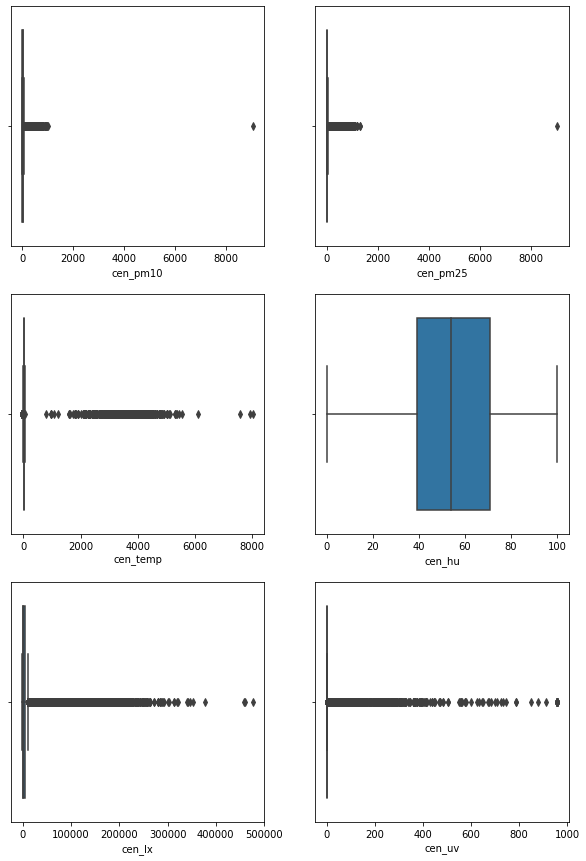

In [22]:
plt.figure(figsize = (10,15))
plt.subplot(321)
ax = sns.boxplot(x = rdata1.cen_pm10)
plt.subplot(322)
ax = sns.boxplot(x = rdata1.cen_pm25)
plt.subplot(323)
ax = sns.boxplot(x = rdata1.cen_temp)
plt.subplot(324)
ax = sns.boxplot(x = rdata1.cen_hu)
plt.subplot(325)
ax = sns.boxplot(x = rdata1.cen_lx)
plt.subplot(326)
ax = sns.boxplot(x = rdata1.cen_uv)

plt.show()

- 조도, 자외선 음수값 0으로 하는게 맞는건지 판단 필요

In [21]:
rdata1.loc[rdata1.cen_lx < 0, 'cen_lx'] = 0
rdata1.loc[rdata1.cen_uv < 0, 'cen_uv'] = 0

## 3) 모든 센서에 대해 겹치는 기간 확인

### (1) 센서별 기간별에 대해 관측치가 unique한지 확인

- 2개인 경우가 10049개 존재 (rdata1기준 10049 * 2 개의 행에서 관측치가 unique하지 않음을 확인)
- 여러 상황들을 확인해 2개의 행이 생성된 이유를 찾아보려 했으나 큰 이유를 알아낼 수 없었음

In [22]:
tmp1 = rdata1.groupby(['serial','tm_snd'])['lon'].agg(len).reset_index()
tmp1 = tmp1.rename({'lon':'length'}, axis = 1) # lon을 정한 이유는 없음
print( tmp1.length.value_counts() ) # 같은 serial, tm_snd인 경우가 10049개 존재!(최대 2번까지 중복)

1.0    6582967
2.0      10049
Name: length, dtype: int64


- 2개 이상인 관측치는 관측값을 평균하여 사용

In [23]:
rdata1 = pd.merge(rdata1, tmp1, on = ['serial','tm_snd'])
rdata1_2 = rdata1.loc[rdata1.length == 2].groupby(['serial','tm_snd']).apply(lambda df: df.apply('mean', axis = 0)).reset_index()
rdata1 = pd.concat( [rdata1.loc[rdata1.length == 1] ,rdata1_2.loc[:,rdata1.columns]], axis = 0 )
rdata1 = rdata1.drop(columns = 'length')

In [26]:
# tmp1 = rdata1.groupby(['serial','tm_snd'])['lon'].agg(len).reset_index()
# tmp1 = tmp1.rename({'lon':'length'}, axis = 1) # lon을 정한 이유는 없음
# print( tmp1.length.value_counts() ) # 같은 serial, tm_snd인 경우가 10049개 존재!(최대 2번까지 중복)

In [24]:
del tmp1, rdata1_2

### (2) 센서별 측정기간 최소 최대값 및 개수 확인
- min_tm은 다양하지만 max_tm은 대부분 5월로 다행히 겹치는 기간 존재! (겹치는 기간에 대해서 Y값들을 가지고 크리깅 예정)

In [28]:
tmp = rdata1.groupby('serial').agg({'tm_snd':['min','max']}).reset_index()
tmp.columns = ['serial','min_tm','max_tm']

tmp = tmp.sort_values(['min_tm','serial'])
tmp = tmp.reset_index(drop = True)
display(tmp)

,serial,min_tm,max_tm
0,B0043,2020-04-01 01:00,2021-05-16 21:00
1,B0044,2020-04-01 01:00,2021-05-16 21:00
2,B0045,2020-04-01 01:00,2021-05-16 21:00
3,B0046,2020-04-01 01:00,2021-05-16 21:00
4,B0047,2020-04-01 01:00,2021-05-16 21:00
...,...,...,...
1059,A072,2021-02-09 12:00,2021-05-16 19:00
1060,A217,2021-02-16 11:00,2021-05-16 21:00
1061,A216,2021-02-16 13:00,2021-05-16 21:00
1062,A218,2021-03-03 12:00,2021-05-16 21:00


### (3) 어떤 기간에 가장 많이 겹치는지 확인

In [26]:
tmp1 = rdata1.groupby('tm_snd').serial.agg(len).reset_index()
tmp1 = tmp1.sort_values('tm_snd', ascending = True)
tmp1 = tmp1.rename({'serial':'length'}, axis = 1)

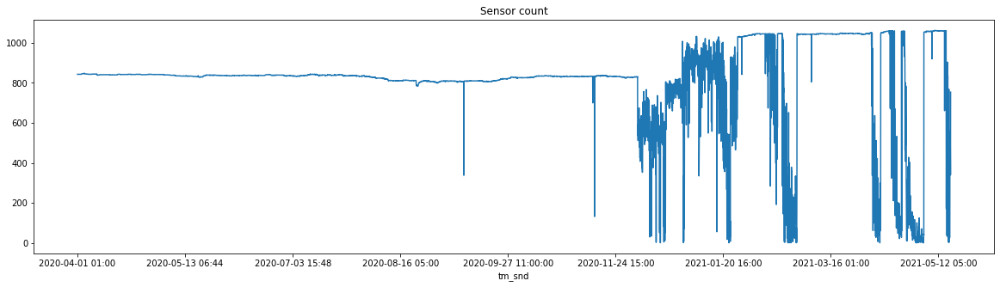

In [30]:
ts_count = tmp1.length.copy()
ts_count.index = tmp1.tm_snd

plt.figure(figsize = (20, 5))
ts_count.plot(title = 'Sensor count')
plt.show()

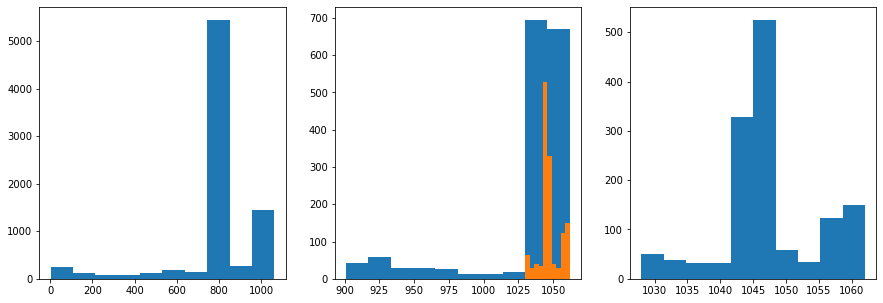

In [31]:
plt.figure(figsize = (15,5))
plt.subplot(131)
plt.hist( ts_count )

plt.subplot(132)
plt.hist( ts_count[ts_count > 900] )

plt.subplot(132)
plt.hist( ts_count[ts_count >= 1030] )

plt.subplot(133)
plt.hist( ts_count[ts_count > 1025] )

plt.show()

In [27]:
select_tm_snd = tmp1.loc[tmp1.length > 1040, 'tm_snd'] # 최소 1040개의 센서가 측정된 날짜 선택

select_tm_snd_hour_cnt = select_tm_snd.map(lambda x: x.split(' ')[0]).value_counts() # 시간대 개수
select_tm_snd_hour = sorted( select_tm_snd_hour_cnt[select_tm_snd_hour_cnt == 24].index )

## 4) 크리깅할 날짜 후보 생성

In [28]:
rdata1['DATE'] = rdata1.tm_snd.map(lambda x: x.split(' ')[0])
rdata1 = rdata1.loc[rdata1.DATE.isin(select_tm_snd_hour)]

In [29]:
print( select_tm_snd_hour ) # 24시간 모두 존재하는 날짜

['2021-02-10', '2021-02-11', '2021-02-12', '2021-02-19', '2021-03-04', '2021-03-05', '2021-03-06', '2021-03-07', '2021-03-09', '2021-03-10', '2021-03-11', '2021-03-12', '2021-03-13', '2021-03-14', '2021-03-15', '2021-03-16', '2021-03-17', '2021-03-18', '2021-03-19', '2021-03-20', '2021-03-21', '2021-03-22', '2021-03-23', '2021-03-24', '2021-03-25', '2021-03-26', '2021-03-27', '2021-03-28', '2021-03-29', '2021-04-06', '2021-04-07', '2021-04-08', '2021-05-07', '2021-05-08', '2021-05-10', '2021-05-11', '2021-05-12', '2021-05-13']


## 5) 후보지 데이터 : 건물 + CCTV

### (1) 건물별 좌표 데이터

In [30]:
df22 = all_data['22']['data'].copy()
df22['centroid'] = df22.geometry.map(Get_Center_Coordinates_Multi)
df22.head()

,BDTYP_CD,BULD_NM,BULD_NM_DC,BULD_SE_CD,BUL_MAN_NO,EMD_CD,GRO_FLO_CO,LNBR_MNNM,LNBR_SLNO,UND_FLO_CO,geometry,centroid
0,02003,디자인하우스,디자인하우스,0,34120,132,4,158,67,0,"MULTIPOLYGON (((126.91380 37.50940, 126.91376 ...","[126.91367764574622, 37.50944928437004]"
1,01003,None,None,0,38620,101,5,547,2,0,"MULTIPOLYGON (((127.08585 37.58623, 127.08584 ...","[127.08582840633532, 37.58619769809041]"
2,02003,None,None,0,38621,102,7,85,23,1,"MULTIPOLYGON (((127.09084 37.59421, 127.09087 ...","[127.0908127310239, 37.594176380088925]"
3,01002,None,None,0,22575,103,3,408,161,1,"MULTIPOLYGON (((127.07896 37.62590, 127.07906 ...","[127.07900811295721, 37.62589234423315]"
4,02003,파크뷰,None,0,22576,102,5,508,32,0,"MULTIPOLYGON (((127.05263 37.62231, 127.05252 ...","[127.05254220279843, 37.62231067114978]"


### (2) CCTV 좌표 데이터

In [31]:
df12 = all_data['12']['data'].copy()

# 특정구에서 lat, lon이 바뀌어져 있음
tmp_idx = df12.loc[df12.lat > 40,].index.to_list() 
df12.loc[tmp_idx, 'lat'], df12.loc[tmp_idx, 'lon'] = df12.loc[tmp_idx, 'lon'], df12.loc[tmp_idx, 'lat']
del tmp_idx

df12['centroid'] = Get_Coordinates_Point(df12.lon, df12.lat)
df12.head()

,sgg_nm,cctv_info,lat,lon,cctv_num,centroid
0,강남구,치수방재,37.524137,127.02260,1,POINT (127.0226002 37.5241369)
1,강남구,방범,37.475090,127.05243,1,POINT (127.05243 37.47509)
2,강남구,방범,37.482200,127.04833,1,POINT (127.04833 37.4822)
3,강남구,방범,37.507610,127.02595,1,POINT (127.02595 37.50761)
4,강남구,방범,37.462590,127.11381,2,POINT (127.11381 37.46259000000001)


### (3) 최종 후보 데이터

In [32]:
candidates_coor = df22.centroid.to_list() + df12.centroid.to_list()
candidates_coor = pd.Series(candidates_coor) # POINT 객체 Series

candidates_df = pd.concat( [candidates_coor.map(lambda a: a.x), candidates_coor.map(lambda a: a.y)], axis = 1) # lon, lat

candidates_df = candidates_df.dropna(axis = 0)
candidates_df = candidates_df.drop_duplicates()
candidates_df = candidates_df.reset_index(drop = True)

candidates_df.columns = ['lon','lat']

# 4. Modeling

## 1) 크리깅 모델을 통한 각 변수별 CV 산출

- 크리깅 수행 함수 : 최종 변수별 cv 값 데이터 프레임명은 z_cv

In [33]:
def kriging_column(col_name):
    ## model_data except sensors including NA
    raw_sensor = df1.loc[df1[col_name] == 1,['serial','lat','lon']].copy()
    model_data = krige_data.loc[:,['serial','lon','lat',col_name]].dropna(axis = 0)
    model_data = pd.merge( model_data, raw_sensor.serial, on = 'serial')

    ## fit the kriging model for sensors removed from 'model_data'
    V = skg.Variogram(Get_Coordinates(model_data.lon, model_data.lat), model_data[col_name], normalize = False, n_lags=20, maxlag=0.5 , bin_func = 'uniform' , verbose = True ,use_nugget = True)
    variogram_model = V.describe()['name']
    variogram_parameters = {'sill':V.describe()['sill'], 'range':V.describe()['effective_range'], 'nugget':V.describe()['nugget']}
    krige_model = OrdinaryKriging(model_data.lon, model_data.lat, model_data[col_name], variogram_model = variogram_model, variogram_parameters = variogram_parameters)

    ## predict values for sensors removed from 'model_data'
    pred_loc1 = raw_sensor.loc[~raw_sensor.serial.isin(model_data.serial)].reset_index(drop = True)
    pred_exp, pred_var = krige_model.execute(style = 'points', xpoints = pred_loc1.lon, ypoints = pred_loc1.lat)

    ## make new 'model_data' with original 'model_data' and prediction of sensors including NA
    pred_loc1 = pd.concat([pred_loc1, pd.Series(pred_exp)], axis = 1, ignore_index = True)
    pred_loc1.columns = model_data.columns
    # model_data = pd.concat([model_data,pred_loc1], axis = 0, ignore_index = True)
    
    ## fit the kriging model for all sensors, displaying variogram plot
    V = skg.Variogram(Get_Coordinates(model_data.lon, model_data.lat), model_data[col_name], normalize = False, n_lags=20, maxlag=0.5 , bin_func = 'uniform' , verbose = True ,use_nugget = True)
    variogram_mode = V.describe()['name']
    variogram_parameters = {'sill':V.describe()['sill'], 'range':V.describe()['effective_range'], 'nugget':V.describe()['nugget']}
    
    print(V.describe())
    V.plot()

    krige_model = OrdinaryKriging(model_data.lon, model_data.lat, model_data[col_name], variogram_model = variogram_model, variogram_parameters = variogram_parameters)

    ##  candidates_df

    ## predict values for candidates_df where consists of buildings and CCTV coordinates
    z_exp, z_var = [], []
    for i in tqdm(range(7)):
        z_exp_tmp, z_var_tmp = krige_model.execute(style = 'points', xpoints = candidates_df.lon[100000*i:100000*(i+1)], ypoints = candidates_df.lat[100000*i:100000*(i+1)])
        z_exp = np.append( z_exp, z_exp_tmp.data )
        z_var = np.append( z_var, z_var_tmp.data )
    
    return (z_exp, z_var, model_data[col_name].mean())

- 날짜 선택 : sel_data
- 적합할 변수(Y) : col_name

In [34]:
print( select_tm_snd_hour ) # sel_data

['2021-02-10', '2021-02-11', '2021-02-12', '2021-02-19', '2021-03-04', '2021-03-05', '2021-03-06', '2021-03-07', '2021-03-09', '2021-03-10', '2021-03-11', '2021-03-12', '2021-03-13', '2021-03-14', '2021-03-15', '2021-03-16', '2021-03-17', '2021-03-18', '2021-03-19', '2021-03-20', '2021-03-21', '2021-03-22', '2021-03-23', '2021-03-24', '2021-03-25', '2021-03-26', '2021-03-27', '2021-03-28', '2021-03-29', '2021-04-06', '2021-04-07', '2021-04-08', '2021-05-07', '2021-05-08', '2021-05-10', '2021-05-11', '2021-05-12', '2021-05-13']


In [35]:
print('cen_pm10','cen_pm25','cen_temp','cen_hu','cen_lx','cen_uv') # col_name

cen_pm10 cen_pm25 cen_temp cen_hu cen_lx cen_uv


  0%|          | 0/6 [00:00<?, ?it/s]

{'name': 'spherical', 'estimator': 'matheron', 'effective_range': 0.011592036941062343, 'sill': 136.60558776767925, 'nugget': 0.9893111971165458, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'uniform', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': True, 'maxlag': 0.18947120369578205, 'n_lags': 20, 'verbose': True}, 'kwargs': {}}



 17%|█▋        | 1/6 [02:45<13:46, 165.23s/it]

17.661006343582702 (654001, 1)



  0%|          | 0/7 [00:00<?, ?it/s]

{'name': 'spherical', 'estimator': 'matheron', 'effective_range': 0.024280485897057093, 'sill': 158.19050338656595, 'nugget': 0.9899999999887681, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'uniform', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': True, 'maxlag': 0.18947120369578205, 'n_lags': 20, 'verbose': True}, 'kwargs': {}}



 33%|███▎      | 2/6 [05:29<10:59, 164.89s/it]

20.740858577429133 (654001, 2)
{'name': 'spherical', 'estimator': 'matheron', 'effective_range': 0.18947056454770497, 'sill': 1.1959820275806665, 'nugget': 0.8559445074699328, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'uniform', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': True, 'maxlag': 0.18947120369578205, 'n_lags': 20, 'verbose': True}, 'kwargs': {}}



 50%|█████     | 3/6 [09:14<09:36, 192.29s/it]

4.995325132321298 (654001, 3)
{'name': 'spherical', 'estimator': 'matheron', 'effective_range': 0.10501274368326101, 'sill': 12.214417935948976, 'nugget': 0.9899999999999999, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'uniform', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': True, 'maxlag': 0.18947120369578205, 'n_lags': 20, 'verbose': True}, 'kwargs': {}}



 67%|██████▋   | 4/6 [12:31<06:28, 194.23s/it]

62.9125116326412 (654001, 4)



  0%|          | 0/7 [00:00<?, ?it/s]

{'name': 'spherical', 'estimator': 'matheron', 'effective_range': 0.16296763847893794, 'sill': 11776135.469946569, 'nugget': 0.9899999999202932, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'uniform', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': True, 'maxlag': 0.18941429122578865, 'n_lags': 20, 'verbose': True}, 'kwargs': {}}



 83%|████████▎ | 5/6 [15:13<03:02, 182.33s/it]

1937.244772820054 (654001, 5)



  0%|          | 0/7 [00:00<?, ?it/s]

{'name': 'spherical', 'estimator': 'matheron', 'effective_range': 0.18490063669495446, 'sill': 4.405044584011139e-05, 'nugget': 0.0006225652229498492, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'uniform', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': True, 'maxlag': 0.18490124807235378, 'n_lags': 20, 'verbose': True}, 'kwargs': {}}



100%|██████████| 6/6 [18:07<00:00, 181.23s/it]


0.03895043515374194 (654001, 6)


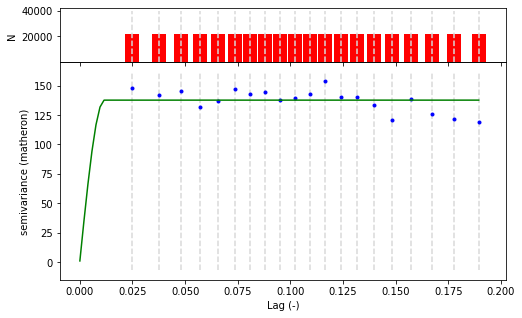

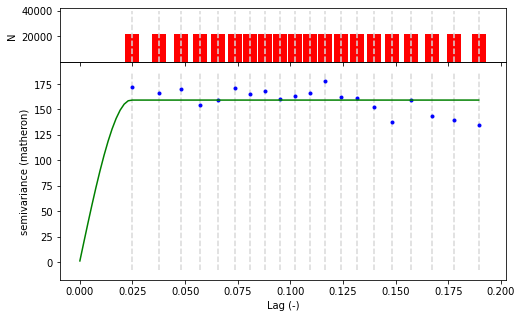

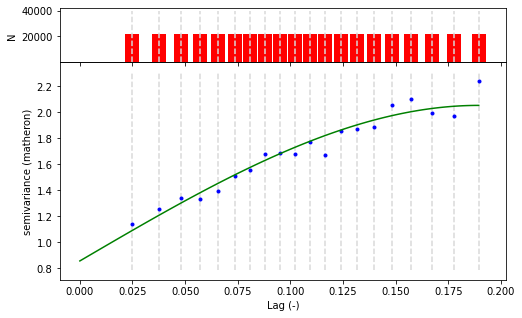

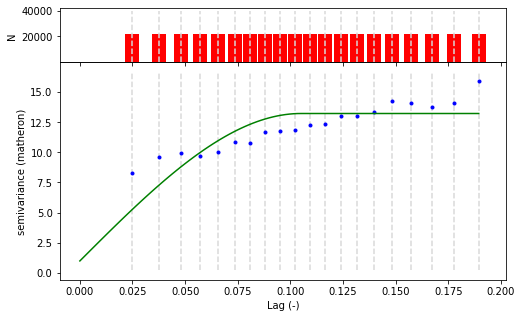

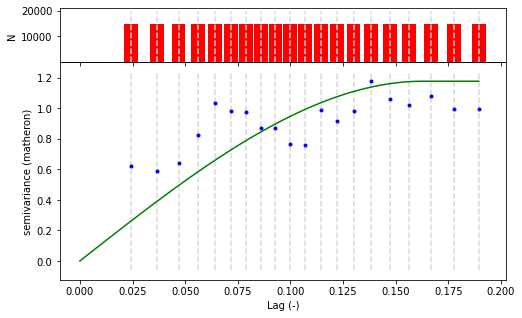

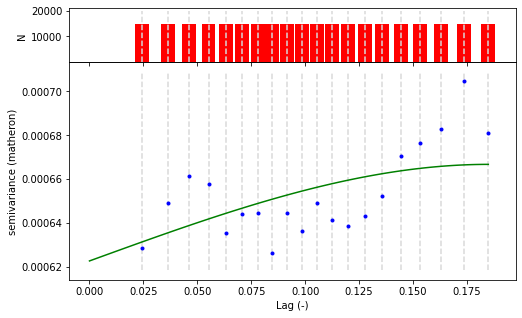

In [36]:
sel_data = select_tm_snd_hour[0]
krige_data = rdata1.loc[rdata1.DATE == sel_data]
krige_data = krige_data.groupby(['serial','lon','lat']).apply(lambda df: df.loc[:,['cen_pm10','cen_pm25','cen_temp','cen_hu','cen_lx','cen_uv']].apply('mean', axis = 0))
krige_data = krige_data.reset_index()

cv_data = pd.DataFrame()

for col_name in tqdm(['cen_pm10','cen_pm25','cen_temp','cen_hu','cen_lx','cen_uv']):
    z_exp, z_var, sensor_mean = kriging_column(col_name)
#     sensor_mean = krige_data[col_name].mean()
    z_cv = pd.Series( np.sqrt(z_var) / sensor_mean )
    cv_data = pd.concat([cv_data, z_cv], axis = 1)
    print( sensor_mean, cv_data.shape )
cv_data.columns = ['cen_pm10','cen_pm25','cen_temp','cen_hu','cen_lx','cen_uv']

In [46]:
my_describe(cv_data)

,NaN_ratio,valid_ratio,count,mean,std,min,25%,50%,75%,max
cen_pm10,0.000,100.000,654001.0,0.441260,0.110203,0.079658,0.363883,0.439707,0.523499,0.662571
cen_pm25,0.000,100.000,654001.0,0.278323,0.072183,0.064490,0.231231,0.274821,0.320231,0.608431
cen_temp,0.000,100.000,654001.0,0.190245,0.001212,0.188494,0.189542,0.190065,0.190554,0.224260
cen_hu,0.000,100.000,654001.0,0.021369,0.001784,0.017438,0.020231,0.021110,0.022135,0.057240
cen_lx,0.000,100.000,654001.0,0.321787,0.092149,0.006642,0.263455,0.319418,0.372340,1.876808
cen_uv,0.003,99.997,653984.0,0.682625,0.082158,0.043151,0.627941,0.659729,0.718194,1.184361


### (1) 산출된 CV값 EDA

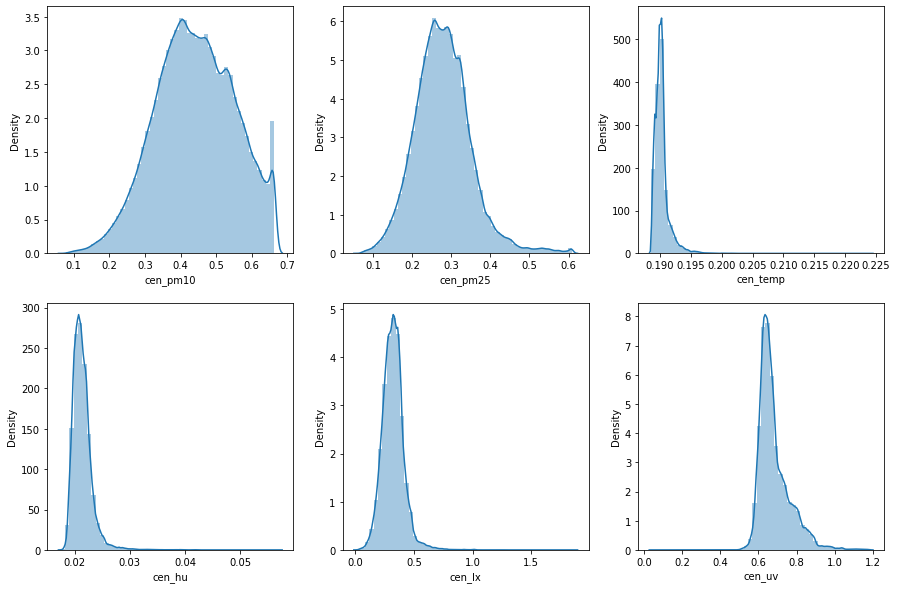

In [47]:
plt.figure(figsize = (15,10))
plt.subplot(231)
sns.distplot(cv_data['cen_pm10'])

plt.subplot(232)
sns.distplot(cv_data['cen_pm25'])

plt.subplot(233)
sns.distplot(cv_data['cen_temp'])

plt.subplot(234)
sns.distplot(cv_data['cen_hu'])

plt.subplot(235)
sns.distplot(cv_data['cen_lx'])

plt.subplot(236)
sns.distplot(cv_data['cen_uv'])

plt.show()

In [37]:
scaler = StandardScaler()   
cv_data_std = pd.DataFrame( scaler.fit_transform(cv_data) )
cv_data_std.columns = cv_data.columns

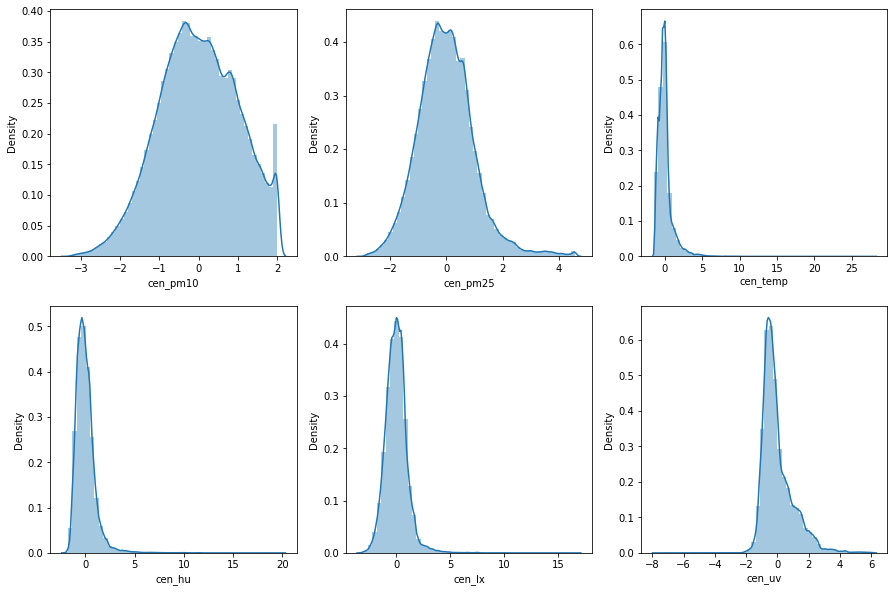

In [49]:
plt.figure(figsize = (15,10))
plt.subplot(231)
sns.distplot(cv_data_std['cen_pm10'])

plt.subplot(232)
sns.distplot(cv_data_std['cen_pm25'])

plt.subplot(233)
sns.distplot(cv_data_std['cen_temp'])

plt.subplot(234)
sns.distplot(cv_data_std['cen_hu'])

plt.subplot(235)
sns.distplot(cv_data_std['cen_lx'])

plt.subplot(236)
sns.distplot(cv_data_std['cen_uv'])

plt.show()

## 2) 가중치(w)
- 추후에 변경 가능, 이번에는 모두 동일한 가중치로 수행
- 가중치를 통한 CV값을 하나의 '불확실성' 으로 산출한 값 : final_cv, final_cv_std(정규화 후 가중치수행)

In [38]:
w = np.array([1,1,1,1,1,1]) # 그냥 평균
w = w / w.sum()

In [39]:
final_cv = pd.Series( np.dot(cv_data, w) )
final_cv_std = pd.Series( np.dot(cv_data_std, w) )

In [63]:
candidates_df = pd.concat([candidates_df, final_cv, final_cv_std], axis = 1)
candidates_df.columns = ['lon','lat','value', 'value_std']
candidates_df = candidates_df.dropna().reset_index(drop = True)
my_describe( candidates_df )

,NaN_ratio,valid_ratio,count,mean,std,min,25%,50%,75%,max
lon,0.0,100.0,653984.0,126.988655,0.081418,126.768092,126.921241,126.998579,127.051098,127.182721
lat,0.0,100.0,653984.0,37.552402,0.052466,37.292660,37.506686,37.552040,37.590197,37.699670
value,0.0,100.0,653984.0,0.322592,0.046158,0.154703,0.291263,0.321362,0.352253,0.610205
value_std,0.0,100.0,653984.0,-0.000310,0.764085,-2.166540,-0.516549,-0.055746,0.417338,10.761524


### (1) 불확실성 EDA

- 불확실성 histogram

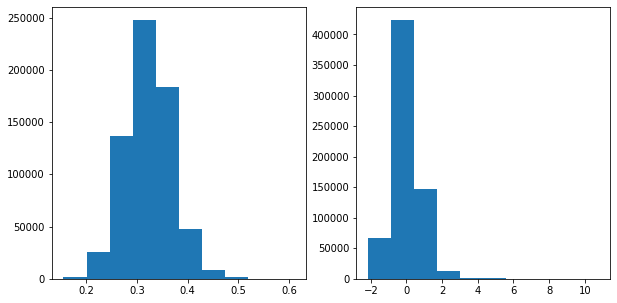

In [41]:
plt.figure(figsize = (10,5))
plt.subplot(121)
plt.hist( candidates_df.value )

plt.subplot(122)
plt.hist( candidates_df.value_std )

plt.show()

- 불확실성 지도에 그리기 ( 데이터가 너무 많아 10%만 뽑아서 그림 )

In [42]:
tmp = candidates_df.sample(frac = 0.1, replace = False, random_state = 1234).reset_index(drop = True) # clients

In [43]:
fig = px.scatter_mapbox(tmp, lat="lat", lon="lon", color="value", size="value",
                        center = CENTER, zoom = ZOOM,
                        color_continuous_scale = px.colors.cyclical.IceFire)
fig.show()

## 3) 불확실성을 토대로 MCLP 수행

### (1) 데이터 준비
- clients, facilites 데이터 : 각각 데이터 중 10%만 뽑아서 수행 (너무 많이 돌리면 서버가 터짐 + 10%만 뽑아도 충분히 모집단을 대표)
- new_clients, new_facilites 데이터 : 위의 데이터로 작게 했음에도 서버가 터짐 -> 각각 1000개, 10000개 뽑아서 수행

In [44]:
clients = pd.DataFrame( [Point(x,y) for x, y in zip(tmp.lon, tmp.lat)], columns = ['geometry'])
facilities = pd.DataFrame( candidates_coor, columns = ['geometry'] ).sample(frac = 0.1, replace = False, random_state = 5678).reset_index(drop = True)

clients["dv"] = ["x[%s]" % c for c in range(clients.shape[0])]
facilities["dv"] = ["y[%s]" % c for c in range(facilities.shape[0])]

clients['lon'] = clients.geometry.map(lambda coor: coor.x)
clients['lat'] = clients.geometry.map(lambda coor: coor.y)
clients['coordinates'] = Get_Coordinates(clients.lon, clients.lat)

facilities['lon'] = facilities.geometry.map(lambda coor: coor.x)
facilities['lat'] = facilities.geometry.map(lambda coor: coor.y)
facilities['coorbdinates'] = Get_Coordinates(facilities.lon, facilities.lat)

clients["weights"] = tmp.value

In [47]:
df_buildings = clients.sample(n = 10000, replace = False, random_state = 1234).reset_index(drop = True) # frac = 0.1

### (2) MCLP 수행

#### Weight 미사용 MCLP

In [49]:
opt_sites1, f1 = mclp(1000, 500, 10000, df_buildings)

----- Configurations -----
  Number of points 10000
  K 1000
  Radius 0.00563444
  M 10000
----- Output -----
  Running time : 38.840984582901 seconds
  Optimal coverage points: 9980


In [50]:
# No Weight
df_candidates_noweight = pd.DataFrame(opt_sites1, columns = ['lon', 'lat'])
fig = px.scatter_mapbox(df_candidates_noweight, lat="lat", lon="lon", 
                        center = CENTER, zoom = ZOOM,)
fig.show()

#### Weight 사용 MCLP

In [51]:
mlcp_results = dict()
mlcp_results['sites'] = [] ; mlcp_results['coverage'] = []
M_range = [1500, 2000, 3000, 4000]
for m in M_range : 
    print('===== M :',m, ' =====')
    opt_sites, f = mclp(K=1000, radius=500, M=m, df=df_buildings, Weight='weights')
    mlcp_results['sites'].append(opt_sites)
    mlcp_results['coverage'].append(f/10000)
    print()

===== M : 1500  =====
----- Configurations -----
  Number of points 10000
  K 1000
  Radius 0.00563444
  M 1500
----- Output -----
  Running time : 29.877500534057617 seconds
  Optimal coverage points: 4184

===== M : 2000  =====
----- Configurations -----
  Number of points 10000
  K 1000
  Radius 0.00563444
  M 2000
----- Output -----
  Running time : 30.5849130153656 seconds
  Optimal coverage points: 5377

===== M : 3000  =====
----- Configurations -----
  Number of points 10000
  K 1000
  Radius 0.00563444
  M 3000
----- Output -----
  Running time : 34.96360468864441 seconds
  Optimal coverage points: 7245

===== M : 4000  =====
----- Configurations -----
  Number of points 10000
  K 1000
  Radius 0.00563444
  M 4000
----- Output -----
  Running time : 38.71422243118286 seconds
  Optimal coverage points: 8451

===== M : 5000  =====
----- Configurations -----
  Number of points 10000
  K 1000
  Radius 0.00563444
  M 5000
----- Output -----
  Running time : 43.56036424636841 second

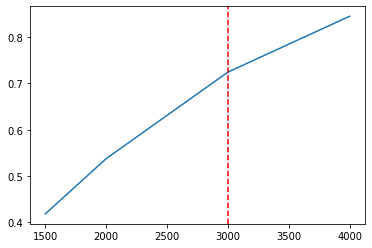

,M Value,coverage
0,1500,0.4184
1,2000,0.5377
2,3000,0.7245
3,4000,0.8451


In [55]:
sns.lineplot(M_range, mlcp_results['coverage'])
plt.axvline(3000, 0, 1, color='red', linestyle='--')
plt.show()

df_ = pd.DataFrame()
df_['M Value'] = M_range
df_['coverage'] = mlcp_results['coverage']
df_

In [58]:
# Weight
idx = 0
print('M Value :', M_range[idx])
print('Coverage :', mlcp_results['coverage'][idx])

df_candidates = pd.DataFrame(mlcp_results['sites'][idx], columns = ['lon', 'lat'])
df_candidates['coordinates'] = Get_Coordinates(df_candidates.lon, df_candidates.lat)
fig = px.scatter_mapbox(df_candidates, lat="lat", lon="lon", 
                        center = CENTER, zoom = ZOOM,)
fig.show()

M Value : 1500
Coverage : 0.4184


In [59]:
# Weight
idx = 1
print('M Value :', M_range[idx])
print('Coverage :', mlcp_results['coverage'][idx])

df_candidates = pd.DataFrame(mlcp_results['sites'][idx], columns = ['lon', 'lat'])
df_candidates['coordinates'] = Get_Coordinates(df_candidates.lon, df_candidates.lat)
fig = px.scatter_mapbox(df_candidates, lat="lat", lon="lon", 
                        center = CENTER, zoom = ZOOM,)
fig.show()

M Value : 2000
Coverage : 0.5377


In [60]:
# Weight
idx = 2
print('M Value :', M_range[idx])
print('Coverage :', mlcp_results['coverage'][idx])

df_candidates = pd.DataFrame(mlcp_results['sites'][idx], columns = ['lon', 'lat'])
df_candidates['coordinates'] = Get_Coordinates(df_candidates.lon, df_candidates.lat)
fig = px.scatter_mapbox(df_candidates, lat="lat", lon="lon", 
                        center = CENTER, zoom = ZOOM,)
fig.show()

M Value : 3000
Coverage : 0.7245


In [61]:
# Weight
idx = 3
print('M Value :', M_range[idx])
print('Coverage :', mlcp_results['coverage'][idx])

df_candidates = pd.DataFrame(mlcp_results['sites'][idx], columns = ['lon', 'lat'])
df_candidates['coordinates'] = Get_Coordinates(df_candidates.lon, df_candidates.lat)
fig = px.scatter_mapbox(df_candidates, lat="lat", lon="lon", 
                        center = CENTER, zoom = ZOOM,)
fig.show()

M Value : 4000
Coverage : 0.8451


In [62]:
idx = 2
print('M Value :', M_range[idx])
print('Coverage :', mlcp_results['coverage'][idx])

df_candidates = pd.DataFrame(mlcp_results['sites'][idx], columns = ['lon', 'lat'])
df_candidates['coordinates'] = Get_Coordinates(df_candidates.lon, df_candidates.lat)

M Value : 3000
Coverage : 0.7245


In [63]:
# 후보지에 주소 넣기
APP_KEY = '42db7de4219862791981cc8d67775735'
URL = 'https://dapi.kakao.com/v2/local/geo/coord2regioncode.json'

def Get_Address(lat, lon) : 
    lat = np.float(lat)
    lon = np.float(lon)
    try : 
        url = '%s?x=%s&y=%s' %(URL, lon, lat)    
        headers = {'Authorization': 'KakaoAK {}'.format(APP_KEY)}
        resp = requests.get(url, headers=headers)
        address = resp.json()['documents'][0]['address_name']
    except Exception as e: 
        print(lat, lon, e)
    return address

df_candidates['address'] = list(map(lambda x, y : Get_Address(x, y), df_candidates.lat, df_candidates.lon))

# 5. 추가 센서 위치 선정

### 1. 소음
---
후보지를 기준으로 버스, 지하철 승하차 인원 계산
1. 후보지 기준으로 300m 이내 버스 정류장이 존재한다.
1. 후보지 기준으로 1000m 이내 지하철역이 존재한다.

In [64]:
#지하철
df10 = all_data['10']['data'].copy()
df11 = all_data['11']['data'].copy()
df10['line'] = df10['line'].str.replace('0','')
df11['OnOff_Subway'] = np.sum(df11.iloc[:, 3:], axis = 1)

In [65]:
df_group = df11.pivot_table(index = ['stn_ln_no','stn_nm'], values = 'OnOff_Subway', aggfunc='mean').reset_index()
df_group.columns = ['line', 'name', 'OnOff_Subway']
df_Subway = pd.merge(df_group, df10)
df_Subway['coordinates'] = Get_Coordinates(df_Subway.lon, df_Subway.lat)
df_Subway.head()

,line,name,OnOff_Subway,code,lat,lon,geometry,coordinates
0,1호선,동대문,600557.000000,155.0,37.571420,127.009745,MULTIPOINT (127.00974 37.57142),"[127.009745, 37.57142]"
1,1호선,동묘앞,503908.615385,159.0,37.572627,127.016429,MULTIPOINT (127.01643 37.57263),"[127.016429, 37.572627]"
2,1호선,시청,969887.769231,151.0,37.564718,126.977108,MULTIPOINT (126.97711 37.56472),"[126.977108, 37.564718]"
3,1호선,신설동,688271.769231,156.0,37.575297,127.025087,MULTIPOINT (127.02509 37.57530),"[127.025087, 37.575297]"
4,1호선,제기동,893897.538462,157.0,37.578103,127.034893,MULTIPOINT (127.03489 37.57810),"[127.034893, 37.578103]"


In [66]:
#버스
df8 = all_data['8']['data'].copy()
df9 = all_data['9_1']['data'].copy()
for i in range(1, len(os.listdir('./9.서울시_버스정류소별_승하차이력'))) : 
    df9 = pd.concat([df9, all_data['9_%s' % i]['data'].copy()])
df9 = df9[~df9['ARS-ID'].str.contains('~')]
df9['ARS-ID'] = df9['ARS-ID'].astype('int')
df9['OnOff_Bus'] = np.sum(df9.iloc[:, 5:], axis = 1)

In [67]:
df_group = df9.pivot_table(index = ['ARS-ID'], values = 'OnOff_Bus', aggfunc='mean').reset_index()
df_group.columns = ['ARS-ID', 'OnOff_Bus']
df_Bus = pd.merge(df_group, df8)
df_Bus['coordinates'] = Get_Coordinates(df_Bus.lon, df_Bus.lat)
df_Bus.head()

,ARS-ID,OnOff_Bus,stn_nm,lon,lat,coordinates
0,1001,192.582965,종로2가사거리,126.987786,37.569764,"[126.9877862, 37.56976415]"
1,1002,210.127549,창경궁.서울대학교병원,126.996520,37.579179,"[126.9965202, 37.57917886]"
2,1003,285.273404,명륜3가.성대입구,126.998290,37.582709,"[126.9982902, 37.58270882]"
3,1004,125.223265,종로2가.삼일교,126.987507,37.568582,"[126.9875072, 37.56858223]"
4,1005,205.531151,혜화동로터리.여운형활동터,127.001694,37.586230,"[127.0016943, 37.58622998]"


Weight 정의

In [68]:
# Weight 정의하기
# 지하철의 경우 : 1000m 반경 내에 있으면 더하기 
# 버스의 경우 : 300m 반경에 있으면 더하기
df_candidates['Noise'] = 0
points = np.array(df_candidates['coordinates'].tolist())

df_ = df_Subway.copy()
sites = np.array(df_['coordinates'].tolist())
D = distance_matrix(points, sites)
radius = (1/88.74/1000)*1000
mask1 = D<=radius
D[mask1]=1 ; D[~mask1]=0
for i in range(D.shape[0]) : 
    near = df_.iloc[D[i] == 1]
    score = np.sum(near['OnOff_Subway'])
    df_candidates.loc[i, 'Noise'] += score
    
df_ = df_Bus.copy()
sites = np.array(df_['coordinates'].tolist())
D = distance_matrix(points, sites)
radius = (1/88.74/1000)*300
mask1 = D<=radius
D[mask1]=1 ; D[~mask1]=0
for i in range(D.shape[0]) : 
    near = df_.iloc[D[i] == 1]
    score = np.sum(near['OnOff_Bus'])
    df_candidates.loc[i, 'Noise'] += score

In [72]:
scaler = MinMaxScaler()
df_candidates['Noise_scaled'] = scaler.fit_transform(df_candidates[['Noise']]).reshape(-1,)

fig = px.scatter_mapbox(df_candidates, 'lat', 'lon',
                        color = 'Noise_scaled', size = 'Noise_scaled',
                        hover_name='address',
                        color_continuous_scale=px.colors.sequential.Reds,
                        center = CENTER, zoom = ZOOM,)
fig.show()

In [73]:
opt_sites, f = mclp(K=200, radius=500, M=700, df=df_candidates, Weight='Noise')

----- Configurations -----
  Number of points 1000
  K 200
  Radius 0.00563444
  M 700
----- Output -----
  Running time : 26.09665298461914 seconds
  Optimal coverage points: 721


In [74]:
df_result = pd.DataFrame(opt_sites)
df_result.columns = ['lon', 'lat']
df_result['coordinates'] = Get_Coordinates(df_result.lon, df_result.lat)

col_name = '추가 센서#1'
df_result[col_name] = 1
df_candidates = pd.merge(df_candidates, df_result[['lon', 'lat', col_name]], how = 'left')
df_candidates[col_name] = df_candidates[col_name].fillna(0).astype('int')

In [76]:
fig = go.Figure()

fig.add_trace(
    go.Scattermapbox(
        lat = df_candidates['lat'],
        lon = df_candidates['lon'],
        mode = 'markers',
        marker = go.Marker(
            size = 8,
            color = df_candidates[col_name],
        ),
        text = df_candidates['address'],
    )
)

fig.update_layout(
    width = 750,
    height = 600,
    mapbox=dict(
        accesstoken = TOKEN,
        zoom=ZOOM,
        center=CENTER
    )
)

fig.show()
# 노란 색이 추가 센서 설치 지점

### 2. 풍향 풍속
---
후보지를 기준으로 가장 가까운 관측지의 가중치를 가져온다.

In [78]:
df5 = all_data['5']['data'].copy()
df5['WD'] = df5['WD'].str.replace('*','')
df5['WS'] = df5['WS'].str.replace('*','').astype('float')
df6 = all_data['6']['data'].copy()

In [79]:
# WD : 바람 방향
# 바람 방향이 변하는 정도 : 각도 변화량
# 각도 변화량의 분산을 지표로 사용
WD_list = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
          'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
RAD_list = [0]
for i in range(1, len(WD_list)) : 
    RAD_list.append(RAD_list[i-1] + 22.5)

In [80]:
df6['WD'] = 0
for location in df5['loc'].unique().tolist() : 
    df_ = df5[df5['loc'] == location]
    diffs = []
    RADs = []
    for i in range(1, df_.shape[0]) : 
        RAD1 = RAD_list[WD_list.index(df_.iloc[i-1]['WD'])]
        RAD2 = RAD_list[WD_list.index(df_.iloc[i]['WD'])]
        diff = np.abs(RAD1-RAD2)
        if(diff > 180) : 
            min_ = np.min([RAD1, RAD2])
            max_ = np.max([RAD1, RAD2])
            diff = 360+min_-max_
        diffs.append(diff)
        RADs.append(RAD2)
    df_.iloc[1:]['WD_diff'] = diffs
    df6.loc[df6['loc'] == location, 'WD'] = np.std(diffs)

Weight 정의

In [81]:
df_group = df5.pivot_table(index = 'loc', values = 'WS', aggfunc='std').reset_index()
df_Wind = pd.merge(df_group, df6)
df_Wind['coordinates'] = Get_Coordinates(df_Wind.lon, df_Wind.lat)

Wind_columns = ['WD', 'WS']
Wind_weights = [0.5, 0.5]
df_Wind['Wind'] = Get_Scaled_Weight(df_Wind, Wind_columns, Wind_weights)

In [82]:
df_Wind[['loc', 'coordinates','WS', 'WD', 'Wind']].sort_values('Wind',ascending = False).head()

,loc,coordinates,WS,WD,Wind
5,광진구,"[127.09430479999999, 37.54495873]",0.636159,73.446839,0.864436
8,노원구,"[127.0685008, 37.65885611]",0.773887,54.125590,0.760012
14,서초구,"[126.99450120000002, 37.50458059]",0.591761,66.592744,0.735600
7,금천구,"[126.908304, 37.45237475]",0.421318,65.109095,0.549407
21,은평구,"[126.93299569999999, 37.61059265]",0.431859,63.753343,0.542942


In [84]:
df_candidates['Wind'] = Get_Candidates_Near_Weight(df_Wind, 'Wind')
scaler = MinMaxScaler()
df_candidates['Wind_scaled'] = scaler.fit_transform(df_candidates[['Wind']]).reshape(-1,)

fig = px.scatter_mapbox(df_candidates, 'lat', 'lon',
                        color = 'Wind_scaled', size = 'Wind_scaled',
                        hover_name='address',
                        color_continuous_scale=px.colors.sequential.Blues,
                        center = CENTER, zoom = ZOOM,)
fig.show()

In [85]:
opt_sites, f = mclp(K=200, radius=500, M=700, df=df_candidates, Weight='Wind')

----- Configurations -----
  Number of points 1000
  K 200
  Radius 0.00563444
  M 700
----- Output -----
  Running time : 28.17120862007141 seconds
  Optimal coverage points: 693


In [86]:
df_result = pd.DataFrame(opt_sites)
df_result.columns = ['lon', 'lat']
df_result['coordinates'] = Get_Coordinates(df_result.lon, df_result.lat)

col_name = '추가 센서#2'
df_result[col_name] = 1
df_candidates = pd.merge(df_candidates, df_result[['lon', 'lat', col_name]], how = 'left')
df_candidates[col_name] = df_candidates[col_name].fillna(0).astype('int')

In [88]:
fig = go.Figure()

fig.add_trace(
    go.Scattermapbox(
        lat = df_candidates['lat'],
        lon = df_candidates['lon'],
        mode = 'markers',
        marker = go.Marker(
            size = 8,
            color = df_candidates[col_name],
        ),
        legendgroup = '[1,0]',
        text = df_candidates['address'],
    )
)

fig.update_layout(
    width = 750,
    height = 600,
    mapbox=dict(
        accesstoken = TOKEN,
        zoom=ZOOM,
        center=CENTER
    )
)

fig.show()
# 노란 색이 추가 센서 설치 지점

### 3. 오존
---
후보지를 기준으로 가장 가까운 관측지의 가중치를 가져온다.

In [89]:
df5 = all_data['5']['data'].copy()
df5['O3'] = df5['O3'].str.replace('*','').astype('float')
df6 = all_data['6']['data'].copy()

In [90]:
df_group = df5.pivot_table(index = 'loc', values = 'O3', aggfunc='mean').reset_index()
df_O3 = pd.merge(df_group, df6)
df_O3['coordinates'] = Get_Coordinates(df_O3.lon, df_O3.lat)
df_O3[['loc', 'coordinates','O3']].sort_values('O3',ascending = False).head()

,loc,coordinates,O3
21,은평구,"[126.93299569999999, 37.61059265]",0.030378
9,도봉구,"[127.0292282, 37.65416617]",0.029068
8,노원구,"[127.0685008, 37.65885611]",0.027932
13,서대문구,"[126.9497638, 37.59374035]",0.027759
6,구로구,"[126.88950249999999, 37.4984887]",0.027485


Weight 정의

In [91]:
df_candidates['O3'] = Get_Candidates_Near_Weight(df_O3, 'O3')
scaler = MinMaxScaler()
df_candidates['O3_scaled'] = scaler.fit_transform(df_candidates[['O3']]).reshape(-1,)

fig = px.scatter_mapbox(df_candidates, 'lat', 'lon',
                        color = 'O3_scaled', size = 'O3_scaled',
                        hover_name='address',
                        color_continuous_scale=px.colors.sequential.Oryel,
                        center = CENTER, zoom = ZOOM,)
fig.show()

In [92]:
opt_sites, f = mclp(K=200, radius=500, M=700, df=df_candidates, Weight='O3')

----- Configurations -----
  Number of points 1000
  K 200
  Radius 0.00563444
  M 700
----- Output -----
  Running time : 25.442421436309814 seconds
  Optimal coverage points: 669


In [93]:
df_result = pd.DataFrame(opt_sites)
df_result.columns = ['lon', 'lat']
df_result['coordinates'] = Get_Coordinates(df_result.lon, df_result.lat)

col_name = '추가 센서#3'
df_result[col_name] = 1
df_candidates = pd.merge(df_candidates, df_result[['lon', 'lat', col_name]], how = 'left')
df_candidates[col_name] = df_candidates[col_name].fillna(0).astype('int')

In [95]:
fig = go.Figure()

fig.add_trace(
    go.Scattermapbox(
        lat = df_candidates['lat'],
        lon = df_candidates['lon'],
        mode = 'markers',
        marker = go.Marker(
            size = 8,
            color = df_candidates[col_name],
        ),
        text = df_candidates['address'],
    )
)

fig.update_layout(
    width = 750,
    height = 600,
    mapbox=dict(
        accesstoken = TOKEN,
        zoom=ZOOM,
        center=CENTER
    )
)

fig.show()
# 노란 색이 추가 센서 설치 지점

### 4. 탄소산화물, 질소산화물, 이산화황
---
후보지를 기준으로 가장 가까운 관측지의 가중치를 가져온다.

In [96]:
df5 = all_data['5']['data'].copy()
df6 = all_data['6']['data'].copy()

In [97]:
# 산화물을 포함한 열이 많음
# 각 열을 scale한 값에 weight를 곱해서 한 개의 값을 만듬 > O2
O2_columns = ['NO', 'NO2', 'NOx', 'CO', 'SO2']
O2_weights = [0.1,0.1,0.2,0.3,0.3]

for col in O2_columns : 
    df5[col] = df5[col].str.replace('*','').astype('float')

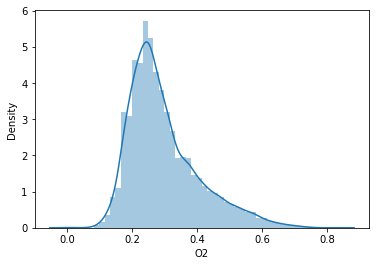

In [98]:
df5['O2'] = Get_Scaled_Weight(df5, O2_columns, O2_weights)

sns.distplot(df5['O2'])
plt.show()

In [99]:
df_group = df5.pivot_table(index = 'loc', values = 'O2', aggfunc='mean').reset_index()
df_O2 = pd.merge(df_group, df6)
df_O2['coordinates'] = Get_Coordinates(df_O2.lon, df_O2.lat)
df_O2[['loc', 'coordinates','O2']].sort_values('O2',ascending = False).head(5)

,loc,coordinates,O2
17,송파구,"[127.09252420000001, 37.50274913]",0.327652
4,관악구,"[126.9271244, 37.48739741]",0.322246
13,서대문구,"[126.9497638, 37.59374035]",0.322156
16,성북구,"[127.02731809999999, 37.60666796]",0.321908
18,양천구,"[126.8557892, 37.52455321]",0.321334


Weight 정의

In [100]:
df_candidates['O2'] = Get_Candidates_Near_Weight(df_O2, 'O2')
scaler = MinMaxScaler()
df_candidates['O2_scaled'] = scaler.fit_transform(df_candidates[['O2']]).reshape(-1,)

fig = px.scatter_mapbox(df_candidates, 'lat', 'lon',
                        color = 'O2_scaled', size = 'O2_scaled',
                        hover_name='address',
                        color_continuous_scale=px.colors.sequential.Blues,
                        center = CENTER, zoom = ZOOM,)
fig.show()

In [101]:
opt_sites, f = mclp(K=200, radius=500, M=700, df=df_candidates, Weight='O2')

----- Configurations -----
  Number of points 1000
  K 200
  Radius 0.00563444
  M 700
----- Output -----
  Running time : 25.341773986816406 seconds
  Optimal coverage points: 688


In [102]:
df_result = pd.DataFrame(opt_sites)
df_result.columns = ['lon', 'lat']
df_result['coordinates'] = Get_Coordinates(df_result.lon, df_result.lat)

col_name = '추가 센서#4'
df_result[col_name] = 1
df_candidates = pd.merge(df_candidates, df_result[['lon', 'lat', col_name]], how = 'left')
df_candidates[col_name] = df_candidates[col_name].fillna(0).astype('int')

In [104]:
fig = go.Figure()

fig.add_trace(
    go.Scattermapbox(
        lat = df_candidates['lat'],
        lon = df_candidates['lon'],
        mode = 'markers',
        marker = go.Marker(
            size = 8,
            color = df_candidates[col_name],
        ),
        text = df_candidates['address'],
    )
)

fig.update_layout(
    width = 750,
    height = 600,
    mapbox=dict(
        accesstoken = TOKEN,
        zoom=ZOOM,
        center=CENTER
    )
)

fig.show()
# 노란 색이 추가 센서 설치 지점

### 5. 암모니아, 황화수소가스
---
해당 데이터는 가스 소비와 많은 관련이 있다고 판단하여 읍면동 기준 가스 소비량을 가중치로 적용
후보지를 기준으로 가장 가까운 관측지의 가중치를 가져온다.

In [105]:
# 가스 데이터
df28_1 = all_data['28_1']['data']
df28_2 = all_data['28_2']['data']
df28_3 = all_data['28_3']['data']

df28 = pd.concat([df28_1, df28_2])
df28 = pd.concat([df28, df28_3])
df28['emd_cd'] = list(map(lambda x : int(x/100), df28.emd_cd))
df28['EMD_CD'] = list(map(lambda x, y : str(x) + str(y), df28.sgg_cd, df28.emd_cd))

In [106]:
# 읍면동 데이터
df14 = all_data['14']['data']
df14['coordinates'] = list(map(lambda x : Multipolygon_to_Center_Coordinates(x), df14.geometry))

In [107]:
df_group = df28.pivot_table(index = 'EMD_CD', values = 'usage', aggfunc='mean').reset_index()
df_group.columns = ['EMD_CD', 'GAS']
df_GAS = pd.merge(df_group, df14)
df_GAS.head()

df_GAS[['EMD_KOR_NM', 'coordinates', 'GAS']].sort_values('GAS', ascending=False).head()

,EMD_KOR_NM,coordinates,GAS
25,종로1가,"[126.97971509426424, 37.570433362326746]",682959.642857
94,장교동,"[126.98698484890613, 37.56744983380499]",413965.125000
358,오쇠동,"[126.79793352945336, 37.54347724379537]",396169.777778
462,강일동,"[127.17337246517222, 37.56743335042113]",388418.636761
77,홍파동,"[126.96398569416802, 37.57115083882253]",335528.450000


Weight 정의

In [109]:
df_candidates['GAS'] = Get_Candidates_Near_Weight(df_GAS, 'GAS')
scaler = MinMaxScaler()
df_candidates['GAS_scaled'] = scaler.fit_transform(df_candidates[['GAS']]).reshape(-1,)

fig = px.scatter_mapbox(df_candidates, 'lat', 'lon',
                        color = 'GAS_scaled', size = 'GAS_scaled',
                        hover_name='address',
                        color_continuous_scale=px.colors.sequential.Bluered,
                        center = CENTER, zoom = ZOOM,)
fig.show()

In [110]:
opt_sites, f = mclp(K=200, radius=500, M=700, df=df_candidates, Weight='GAS')

----- Configurations -----
  Number of points 1000
  K 200
  Radius 0.00563444
  M 700
----- Output -----
  Running time : 25.223477602005005 seconds
  Optimal coverage points: 705


In [111]:
df_result = pd.DataFrame(opt_sites)
df_result.columns = ['lon', 'lat']
df_result['coordinates'] = Get_Coordinates(df_result.lon, df_result.lat)

col_name = '추가 센서#5'
df_result[col_name] = 1
df_candidates = pd.merge(df_candidates, df_result[['lon', 'lat', col_name]], how = 'left')
df_candidates[col_name] = df_candidates[col_name].fillna(0).astype('int')

In [113]:
fig = go.Figure()

fig.add_trace(
    go.Scattermapbox(
        lat = df_candidates['lat'],
        lon = df_candidates['lon'],
        mode = 'markers',
        marker = go.Marker(
            size = 8,
            color = df_candidates[col_name],
        ),
        text = df_candidates['address'],
    )
)

fig.update_layout(
    width = 750,
    height = 600,
    mapbox=dict(
        accesstoken = TOKEN,
        zoom=ZOOM,
        center=CENTER
    )
)

fig.show()
# 노란 색이 추가 센서 설치 지점

In [128]:
df_result = df_candidates[['address', 'lat', 'lon', '추가 센서#1','추가 센서#2','추가 센서#3','추가 센서#4','추가 센서#5']].reset_index()
df_result.columns = ['순번', '설치위치 주소', '위도(X)', '경도(Y)', '추가 센서#1','추가 센서#2','추가 센서#3','추가 센서#4','추가 센서#5']
df_result.head()

,순번,설치위치 주소,위도(X),경도(Y),추가 센서#1,추가 센서#2,추가 센서#3,추가 센서#4,추가 센서#5
0,0,서울특별시 서초구 신원동,37.430535,127.071144,0,0,1,0,0
1,1,서울특별시 은평구 진관동,37.657997,126.946956,0,1,0,0,0
2,2,서울특별시 강동구 강일동,37.576583,127.167664,0,0,0,0,0
3,3,서울특별시 구로구 항동,37.474338,126.818004,0,0,0,0,0
4,4,서울특별시 강북구 우이동,37.671606,127.006812,0,0,0,0,0


In [119]:
df_result.to_csv('결과 제출파일_설치위치별 추가센서.csv', index = False, encoding = 'utf8')